# Data attributes
# Below are the dataset column names and their meaning.

- sku: The unique product identifier (ASINs in these datasets).

- name: The product name.

- review_avg: The average review rating.

- review_count: The total number of reviews.

- ranks: All category identifiers and associated best selling rank for the category.

- min_rank: Best (smallest) rank across bestseller categories.

- max_rank: Worst (highest) rank across bestseller categories.

- ranks_count: Number of bestseller categories the product was found in.

- offer: Best offer price in local currency, e.g. GBP, USD, EUR.

- offers: Number of offers (may include used or warehouse offers).

- tag1: Additional data like product type, author, brand, etc.

- tag2: Additional data like product type, author, brand, etc.

- request_date: Date the data was retrieved.

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

plt.style.use('seaborn-v0_8')

In [2]:
pip install plotly

In [3]:
df = pd.read_excel('bestsellers_amazon_com_bestsellers1mrowsTO10000xlsx.xlsx')

In [4]:
df.head()

,sku,name,review_avg,review_count,ranks,min_rank,max_rank,ranks_count,offer,offers,tag1,tag2,request_date
0,B00I3A00V8,Pillow Perfect Outdoor/Indoor Pom Play Peachti...,4.7,2089.0,{/lawn-garden/3480724011/=60},60,60,1,53.99,2.0,NaN,NaN,2022-05-08
1,B0987JF1W3,2 Inch Stainless Steel V Band Clamp Male Femal...,4.1,37.0,"{/automotive/15726851/=13, /automotive/1572683...",13,63,2,16.99,1.0,NaN,NaN,2022-05-08
2,B072KCVXL6,Godsen Men's Comfort Sleepwear Short Sleeve Ni...,NaN,NaN,{/fashion/23572886011/=37},37,37,1,NaN,NaN,NaN,NaN,2022-05-08
3,B00GHA2HDA,Undertow (Oceanswept Trilogy Book 2),4.7,90.0,"{/books/10367787011/=78, /digital-text/7006614...",70,78,2,3.68,1.0,Lara Hays,Kindle Edition,2022-05-08
4,B09718KGVQ,Meengg Cropped Pants for Women Casual Cotton L...,NaN,NaN,{/fashion/2515150011/=12},12,12,1,6.99,206.0,NaN,NaN,2022-05-08


In [5]:
df.dtypes

sku              object
name             object
review_avg      float64
review_count    float64
ranks            object
min_rank          int64
max_rank          int64
ranks_count       int64
offer           float64
offers          float64
tag1             object
tag2             object
request_date     object
dtype: object

In [6]:
df.columns

Index(['sku', 'name', 'review_avg', 'review_count', 'ranks', 'min_rank',
       'max_rank', 'ranks_count', 'offer', 'offers', 'tag1', 'tag2',
       'request_date'],
      dtype='object')

In [7]:
baby_df = df.copy()

In [8]:
baby_df.shape

(1000000, 13)

In [9]:
baby_df = df[df['ranks'].str.contains('baby')]

In [10]:
baby_df.shape

(10694, 13)

In [11]:
baby_df.to_csv('baby-dataframe.csv', index=False)

In [12]:
df = pd.read_csv('baby-dataframe.csv')
df.head()

,sku,name,review_avg,review_count,ranks,min_rank,max_rank,ranks_count,offer,offers,tag1,tag2,request_date
0,B08DL8TQY5,Sweet Jojo Designs Pink Floral Rose Girl Long ...,4.6,14.0,{/baby-products/166753011/=72},72,72,1,NaN,NaN,NaN,NaN,2022-05-08
1,B07J5898C5,Mini Tudou Baby Musical Crib Mobile with Proje...,4.0,3429.0,{/baby-products/166880011/=26},26,26,1,37.99,1.0,NaN,NaN,2022-05-08
2,B07GXYTTB8,"Bamboobies Women’s Nursing Pads, Reusable and ...",4.6,614.0,{/baby-products/16225011/=93},93,93,1,32.99,1.0,NaN,NaN,2022-05-08
3,B0818TL4Z4,"Kids Hair Washing Chair, Children Shampoo Chai...",4.4,387.0,{/baby-products/166864011/=86},86,86,1,59.99,1.0,NaN,NaN,2022-05-08
4,B08M3JWP7K,"Little Man Cave, Toddler Boy Room Decor, 12′′x...",4.7,1148.0,"{/baby-products/166885011/=24, /home-garden/40...",24,29,4,8.99,1.0,NaN,NaN,2022-05-08


In [13]:
df.drop(columns=['tag1', 'tag2', 'request_date'], inplace = True)

In [14]:
df.columns

Index(['sku', 'name', 'review_avg', 'review_count', 'ranks', 'min_rank',
       'max_rank', 'ranks_count', 'offer', 'offers'],
      dtype='object')

In [15]:
df.isnull().sum()

sku                0
name               0
review_avg       752
review_count     752
ranks              0
min_rank           0
max_rank           0
ranks_count        0
offer           1149
offers          1149
dtype: int64

In [16]:
df.duplicated().sum()

0

In [17]:
df.shape

(10694, 10)

In [18]:
df['offer'].replace(np.nan, 0, inplace=True)
df['offers'].replace(np.nan, 0, inplace=True)

In [19]:
df['review_avg'].replace(np.nan, 0, inplace=True)
df['review_count'].replace(np.nan, 0, inplace=True)

In [20]:
df.dtypes

sku              object
name             object
review_avg      float64
review_count    float64
ranks            object
min_rank          int64
max_rank          int64
ranks_count       int64
offer           float64
offers          float64
dtype: object

In [21]:
df['offer'] = pd.to_numeric(df['offer'], errors='coerce')
df['offers'] = pd.to_numeric(df['offers'], errors='coerce')

In [22]:
df.describe()

,review_avg,review_count,min_rank,max_rank,ranks_count,offer,offers
count,10694.000000,10694.000000,10694.000000,10694.000000,10694.000000,10694.000000,10694.000000
mean,4.147513,1242.954647,47.427529,58.206190,1.565831,42.538790,2.733495
std,1.227364,3598.320376,29.092964,26.418246,1.226182,95.015151,8.779639
min,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,4.200000,20.000000,22.000000,37.000000,1.000000,9.990000,1.000000
50%,4.500000,165.000000,45.000000,60.000000,1.000000,17.990000,1.000000
75%,4.700000,887.750000,72.000000,81.000000,2.000000,34.990000,2.000000
max,5.000000,78764.000000,100.000000,100.000000,18.000000,2632.000000,333.000000


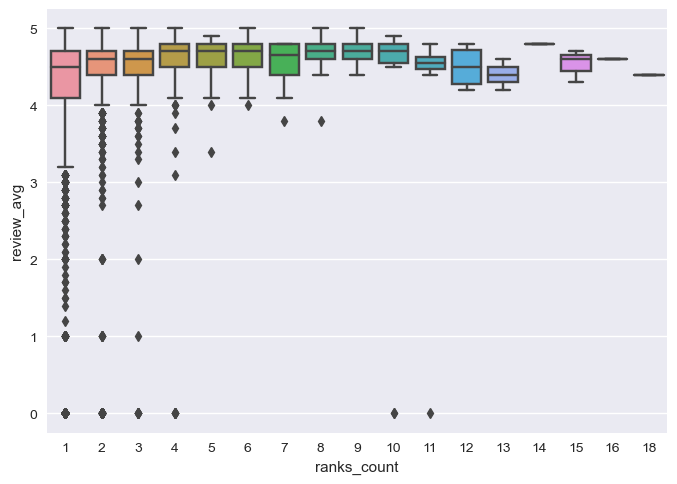

In [23]:
sns.boxplot(x='ranks_count', y='review_avg', data=df)
plt.show()


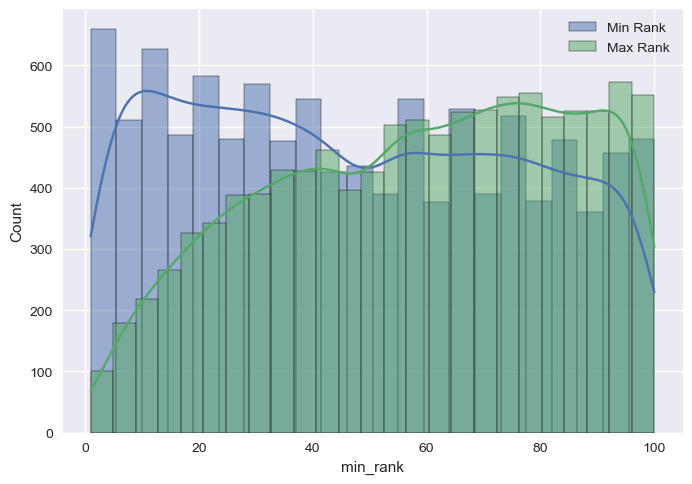

In [24]:
sns.histplot(df['min_rank'], label='Min Rank', kde=True)
sns.histplot(df['max_rank'], label='Max Rank', kde=True)
plt.legend()
plt.show()


C:\Users\xjwil\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


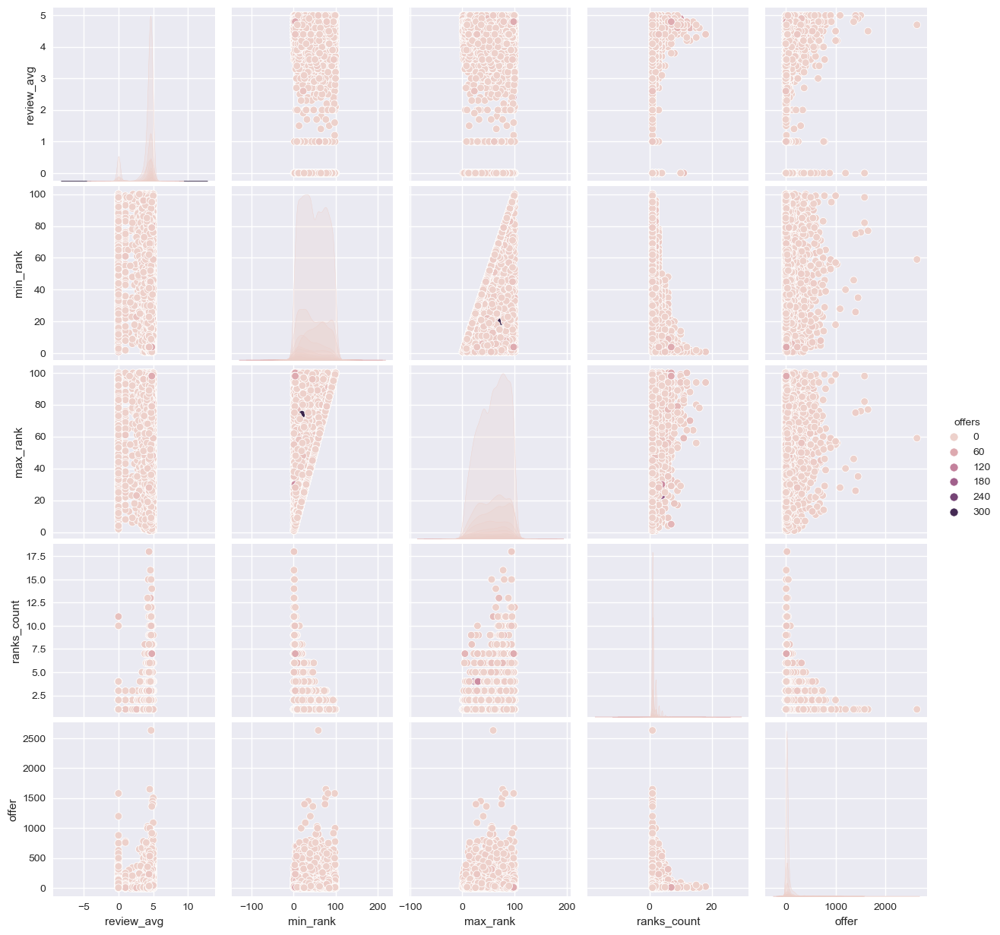

In [25]:
sns.pairplot(df[['review_avg', 'min_rank', 'max_rank', 'ranks_count', 'offer', 'offers']], hue='offers')
plt.show()


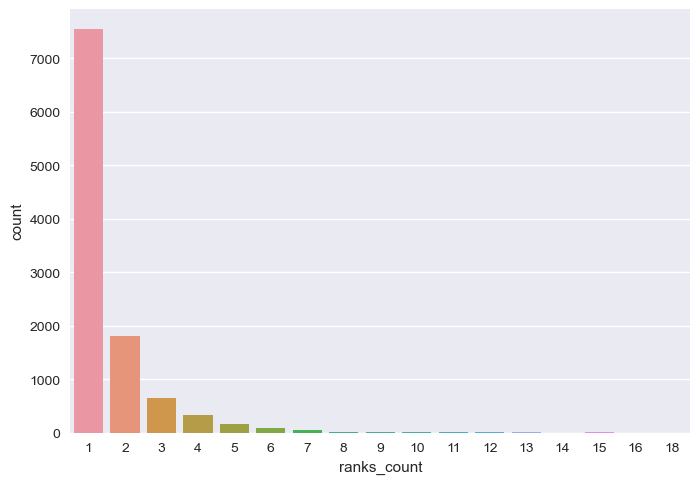

In [26]:
sns.countplot(x='ranks_count', data=df)
plt.show()


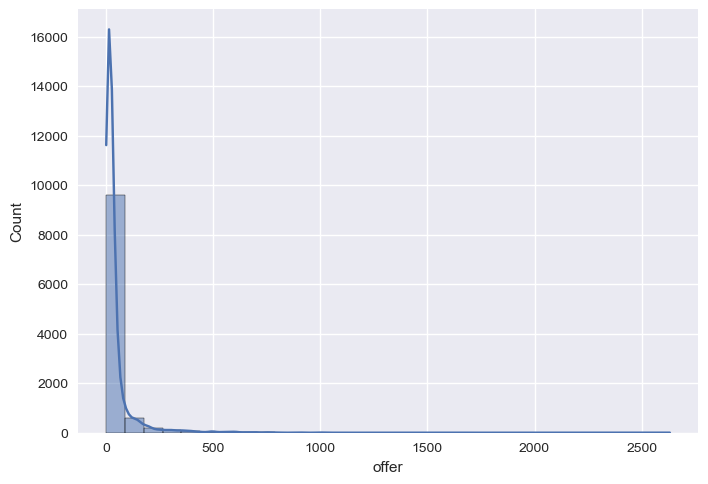

In [27]:
sns.histplot(df['offer'], bins=30, kde=True)
plt.show()


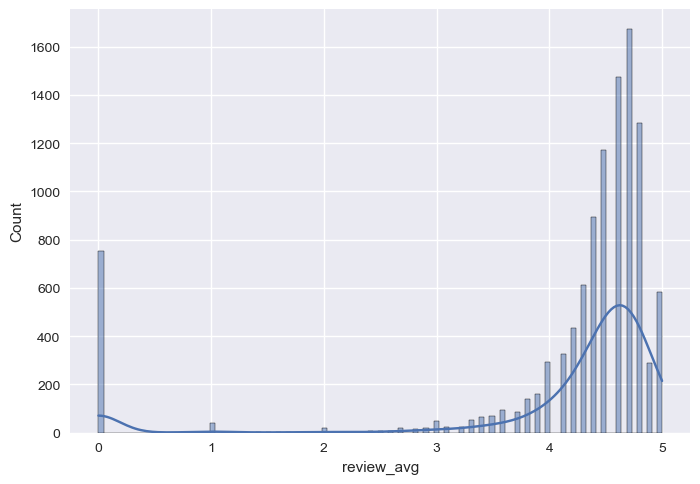

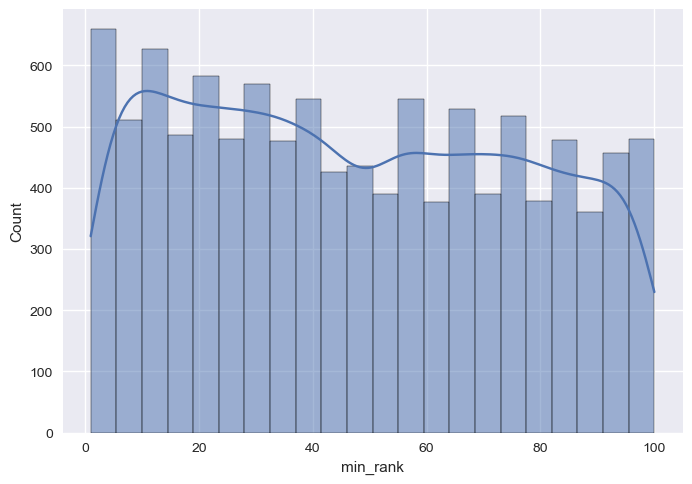

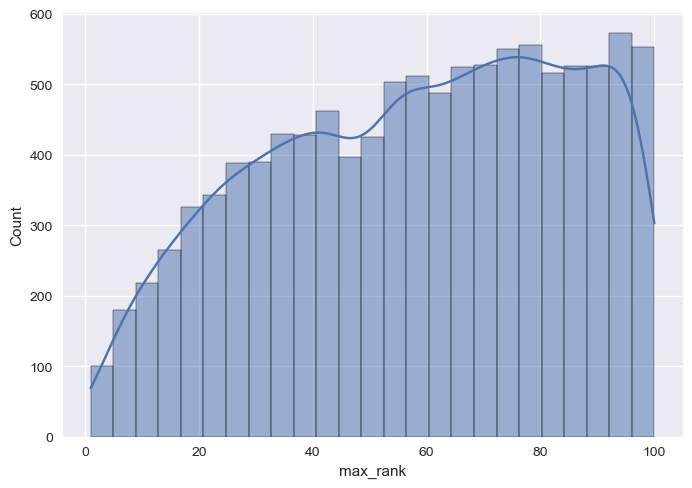

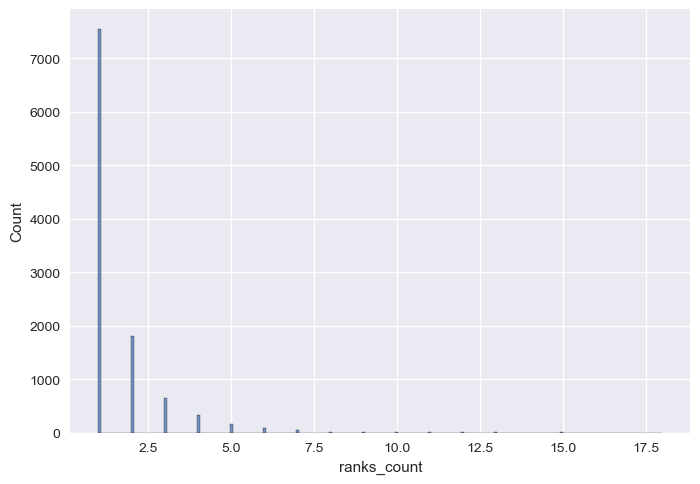

In [28]:
sns.histplot(df['review_avg'], kde=True)
plt.show()

sns.histplot(df['min_rank'], kde=True)
plt.show()

sns.histplot(df['max_rank'], kde=True)
plt.show()

sns.histplot(df['ranks_count'])
plt.show()


C:\Users\xjwil\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


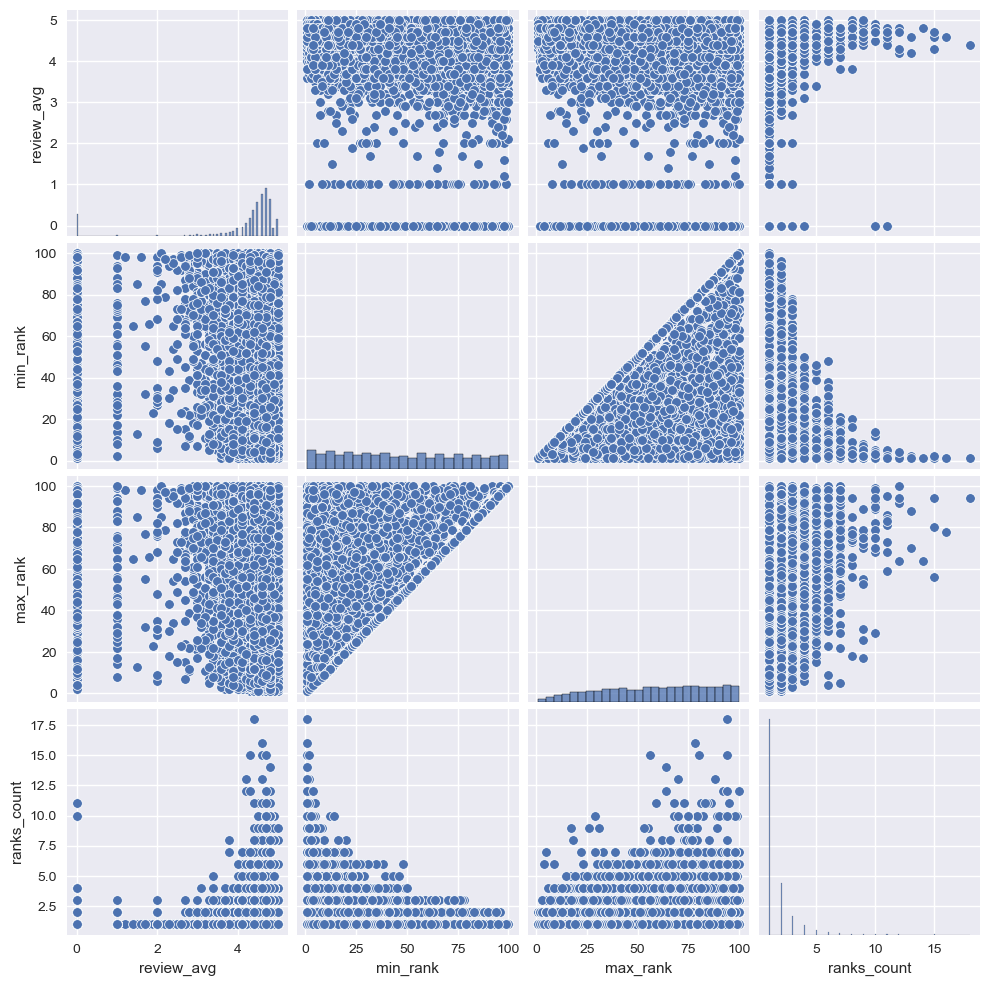

In [29]:
sns.pairplot(df[['review_avg', 'min_rank', 'max_rank', 'ranks_count']])
plt.show()


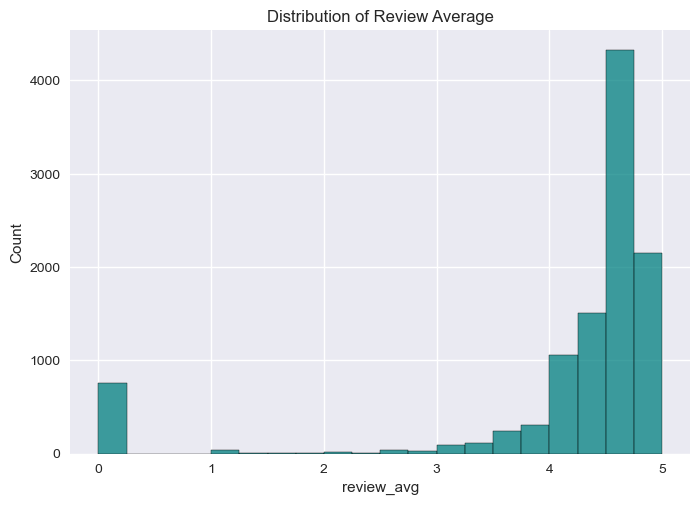

In [30]:
# Plot it
sns.histplot(df['review_avg'], color = 'teal', bins = 20) # colors:

# Create a descriptive title
plt.title('Distribution of Review Average');

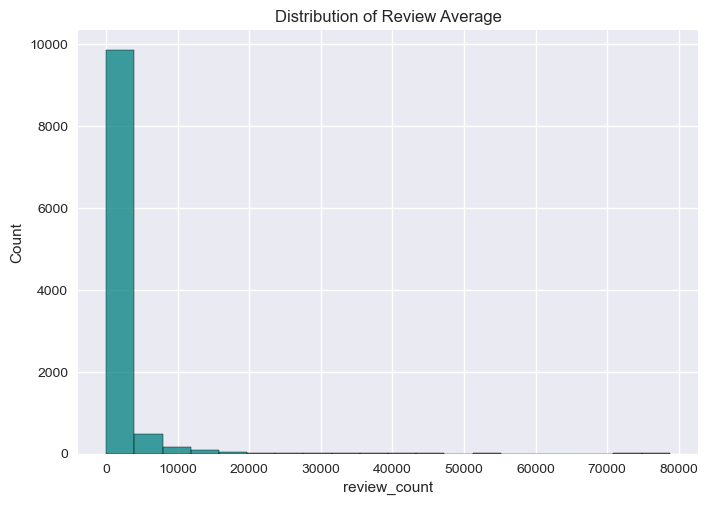

In [31]:
# Plot it
sns.histplot(df['review_count'], color = 'teal', bins = 20) # colors:

# Create a descriptive title
plt.title('Distribution of Review Average');

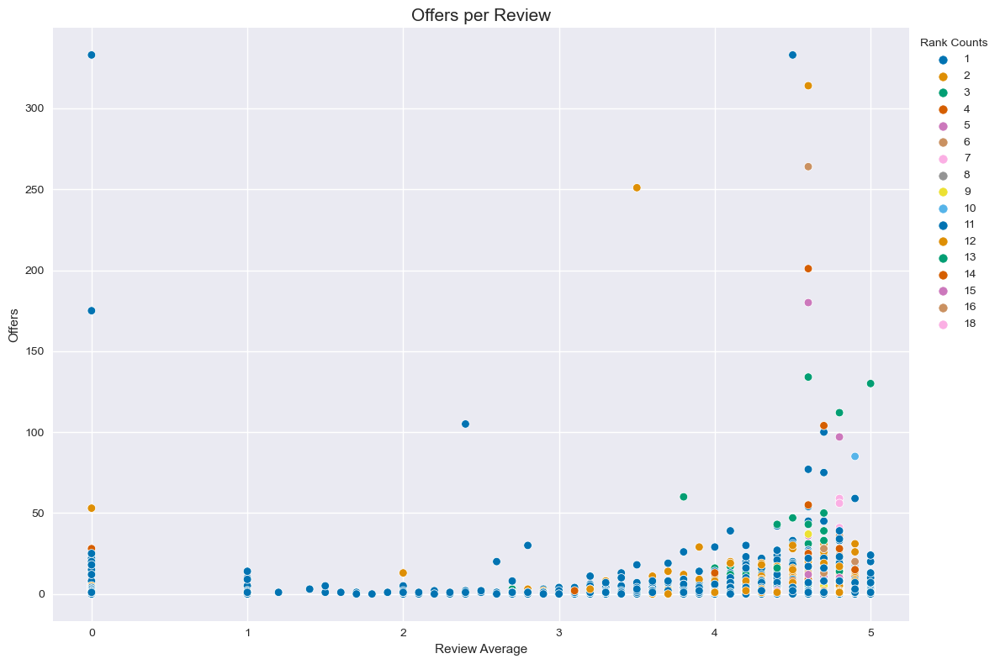

In [32]:
# Size
plt.figure(figsize = (12, 8))

sns.scatterplot(x = df['review_avg'], y = df['offers'], hue = df['ranks_count'], palette ='colorblind')

# Create a descriptive title
plt.title('Offers per Review', fontsize = 15)

# Add axis labels
plt.xlabel('Review Average')
plt.ylabel('Offers')

plt.legend(title='Rank Counts', bbox_to_anchor=(1,1), loc='upper left')
plt.tight_layout();

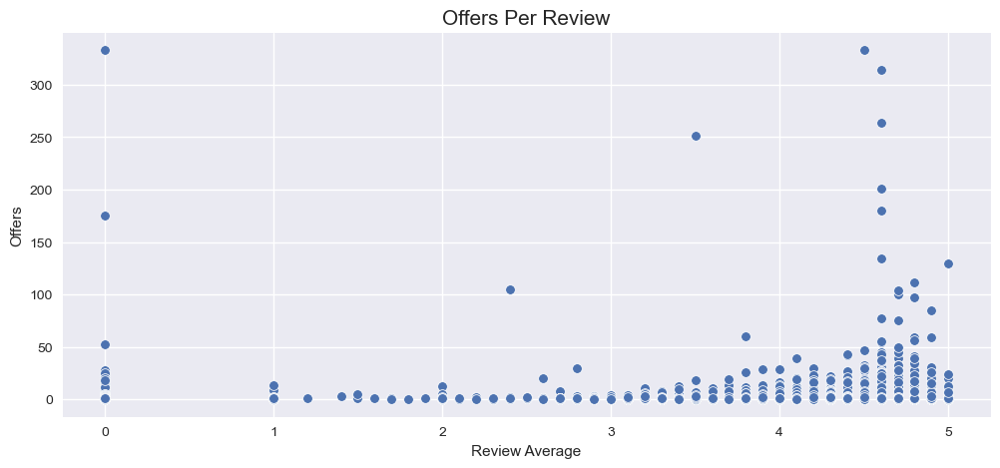

In [33]:
# Size
plt.figure(figsize = (12, 5))

sns.scatterplot(x = df['review_avg'], y = df['offers'])

# Create a descriptive title
plt.title('Offers Per Review', fontsize = 15)

# Add axis labels
plt.xlabel('Review Average')
plt.ylabel('Offers');

C:\Users\xjwil\AppData\Local\Temp\ipykernel_16520\3719347482.py:8: UserWarning: 
The palette list has fewer values (2) than needed (100) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x = df['review_avg'], y = df['offers'], hue = df['max_rank'], palette = ['b', 'r'])


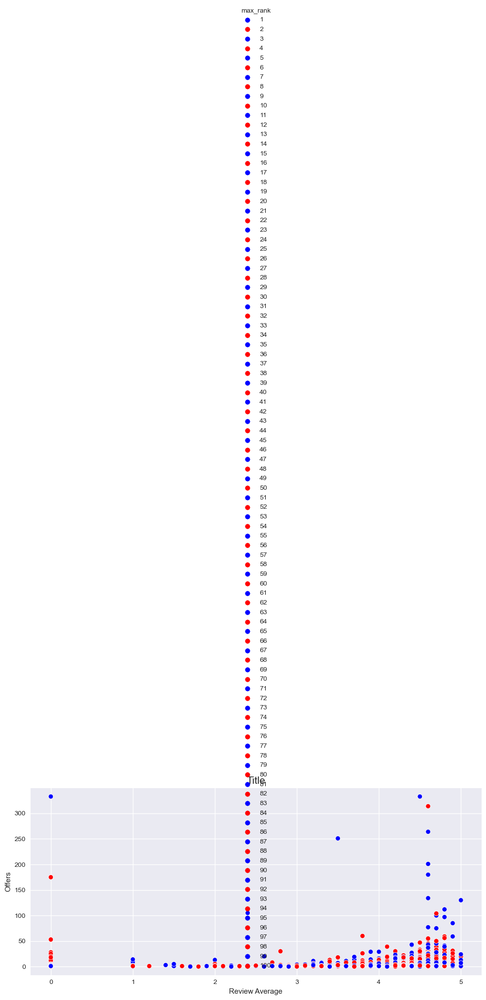

In [34]:
#Experimenting



# Size
plt.figure(figsize = (12, 5))

sns.scatterplot(x = df['review_avg'], y = df['offers'], hue = df['max_rank'], palette = ['b', 'r'])

# Create a descriptive title
plt.title('Title', fontsize = 15)

# Add axis labels
plt.xlabel('Review Average')
plt.ylabel('Offers');

In [35]:
df.head()

,sku,name,review_avg,review_count,ranks,min_rank,max_rank,ranks_count,offer,offers
0,B08DL8TQY5,Sweet Jojo Designs Pink Floral Rose Girl Long ...,4.6,14.0,{/baby-products/166753011/=72},72,72,1,0.00,0.0
1,B07J5898C5,Mini Tudou Baby Musical Crib Mobile with Proje...,4.0,3429.0,{/baby-products/166880011/=26},26,26,1,37.99,1.0
2,B07GXYTTB8,"Bamboobies Women’s Nursing Pads, Reusable and ...",4.6,614.0,{/baby-products/16225011/=93},93,93,1,32.99,1.0
3,B0818TL4Z4,"Kids Hair Washing Chair, Children Shampoo Chai...",4.4,387.0,{/baby-products/166864011/=86},86,86,1,59.99,1.0
4,B08M3JWP7K,"Little Man Cave, Toddler Boy Room Decor, 12′′x...",4.7,1148.0,"{/baby-products/166885011/=24, /home-garden/40...",24,29,4,8.99,1.0


In [36]:
df['offer'].value_counts()

offer
0.00      1149
9.99       332
12.99      238
19.99      236
14.99      225
          ... 
21.30        1
5.77         1
145.35       1
174.98       1
232.00       1
Name: count, Length: 2595, dtype: int64

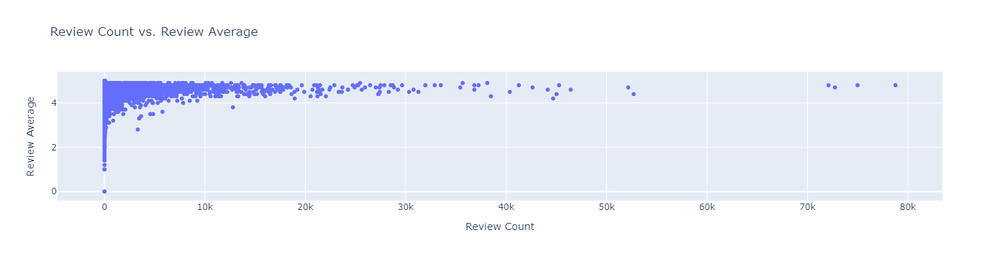

In [37]:
#refer to number 1

# Example: Scatter plot for review count vs. review average
fig_review_scatter = px.scatter(df, x='review_count', y='review_avg', title='Review Count vs. Review Average')

# Customize the layout if needed
fig_review_scatter.update_layout(
    xaxis_title='Review Count',
    yaxis_title='Review Average',
    #template="plotly_dark",
)

# Show the chart
fig_review_scatter.show()


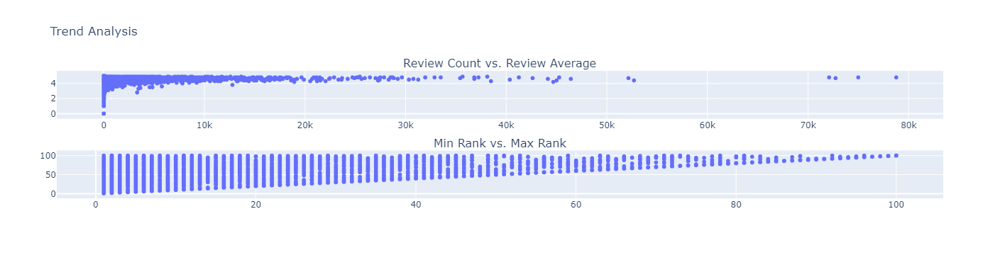

In [38]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# Create the scatter plot
fig_review_scatter = px.scatter(df, x='review_count', y='review_avg', title='Review Count vs. Review Average')

# Create another scatter plot with different columns
fig_other_scatter = px.scatter(df, x='min_rank', y='max_rank', title='Min Rank vs. Max Rank')

# Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=['Review Count vs. Review Average', 'Min Rank vs. Max Rank'])
fig.add_trace(fig_review_scatter['data'][0], row=1, col=1)
fig.add_trace(fig_other_scatter['data'][0], row=2, col=1)

# Update layout
fig.update_layout(title='Trend Analysis')

# Show the dashboard
fig.show()


In [39]:
import plotly.graph_objects as go

# Scatter plot
fig_review_scatter = go.Figure()

# Add scatter plot trace
fig_review_scatter.add_trace(go.Scatter(
    x=df['review_count'],
    y=df['review_avg'],
    mode='markers',
    name='Review Count vs. Review Average',
    hovertemplate='Review Count: %{x}<br>Review Average: %{y}',
))

# Update layout
fig_review_scatter.update_layout(
    title='Review Count vs. Review Average',
    xaxis_title='Review Count',
    yaxis_title='Review Average',
    template="plotly_dark",
)

# Add dropdown menu
name_values = df['name'].unique().tolist()  # Replace 'name' with your actual column name
buttons = [dict(label=name, method='update', args=[{'visible': [name == i for i in name_values]}]) for name in name_values]

fig_review_scatter.update_layout(
    updatemenus=[{'active': 0, 'buttons': buttons}],
)

# Show the chart
fig_review_scatter.show()


In [40]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo

# Scatter plot
fig_review_scatter = go.Figure()

# Add scatter plot trace
fig_review_scatter.add_trace(go.Scatter(
    x=df['review_count'],
    y=df['review_avg'],
    mode='markers',
    name='Review Count vs. Review Average',
    hovertemplate='Review Count: %{x}<br>Review Average: %{y}',
))

# Update layout
fig_review_scatter.update_layout(
    title='Review Count vs. Review Average',
    xaxis_title='Review Count',
    yaxis_title='Review Average',
    template="plotly_dark",
)

# Add dropdown menu
name_values = df['name'].unique().tolist()  # Replace 'name' with your actual column name
buttons = [dict(label=name, method='update', args=[{'visible': [name == i for i in name_values]}]) for name in name_values]

fig_review_scatter.update_layout(
    updatemenus=[{'active': 0, 'buttons': buttons}],
)

# Display the chart in the notebook
pyo.init_notebook_mode(connected=True)
pyo.iplot(fig_review_scatter)


In [41]:
import plotly.offline as pyo

# ... (your plot creation code)

# Display the chart using plotly.offline.plot
pyo.plot(fig_review_scatter, filename='review_scatter.html')


'review_scatter.html'

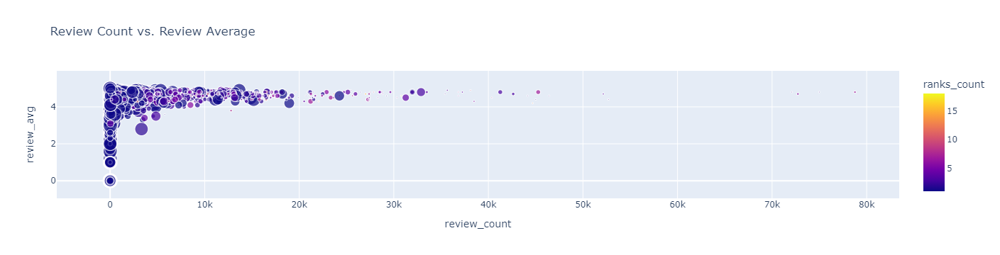

<Figure size 1200x800 with 0 Axes>

In [42]:
import plotly.express as px
plt.figure(figsize=(12,8))
# Scatter plot with color-coded points
fig_review_scatter = px.scatter(df, x='review_count', y='review_avg', title='Review Count vs. Review Average',
                                 color='ranks_count', hover_name='name', size='min_rank') #template="plotly_dark")

# Display the chart in the notebook
fig_review_scatter.show()


In [43]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Scatter plot 1
fig_review_scatter = go.Figure()
fig_review_scatter.add_trace(go.Scatter(
    x=df['review_count'],
    y=df['review_avg'],
    mode='markers',
    name='Review Count vs. Review Average',
    hovertemplate='Review Count: %{x}<br>Review Average: %{y}',
))
fig_review_scatter.update_layout(
    title='Review Count vs. Review Average',
    xaxis_title='Review Count',
    yaxis_title='Review Average',
    template="plotly_dark"
)

# Scatter plot 2
fig_other_scatter = go.Figure()
fig_other_scatter.add_trace(go.Scatter(
    x=df['min_rank'],
    y=df['max_rank'],
    mode='markers',
    name='Min Rank vs. Max Rank',
    hovertemplate='Min Rank: %{x}<br>Max Rank: %{y}',
))
fig_other_scatter.update_layout(
    title='Min Rank vs. Max Rank',
    xaxis_title='Min Rank',
    yaxis_title='Max Rank',
    template="plotly_dark"
)

# Create subplot with two rows and one column
fig_combined = make_subplots(rows=2, cols=1, shared_xaxes=True)

# Add scatter plots to the subplot
fig_combined.add_trace(fig_review_scatter.data[0], row=1, col=1)
fig_combined.add_trace(fig_other_scatter.data[0], row=2, col=1)

# Update layout of the combined figure
fig_combined.update_layout(template="plotly_dark")

# Save the combined figure to an HTML file
fig_combined.write_html('combined_dashboard.html')


In [44]:
import plotly.express as px

# Scatter plot with color-coded points
fig_review_scatter = px.scatter(df, x='review_count', y='review_avg', title='Review Count vs. Review Average',
                                 color='ranks_count', hover_name='name', size='min_rank', template="plotly_dark")

# Save the plot to HTML
fig_review_scatter.write_html('scatter_color_coded.html')


In [45]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# Create the scatter plot
fig_review_scatter = px.scatter(df, x='review_count', y='review_avg', title='Review Count vs. Review Average')

# Create another scatter plot with different columns
fig_other_scatter = px.scatter(df, x='min_rank', y='max_rank', title='Min Rank vs. Max Rank')

# Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=['Review Count vs. Review Average', 'Min Rank vs. Max Rank'])
fig.add_trace(fig_review_scatter['data'][0], row=1, col=1)
fig.add_trace(fig_other_scatter['data'][0], row=2, col=1)

# Update layout
fig.update_layout(title='Trend Analysis')

# Save the dashboard to HTML
fig.write_html('subplot_dashboard.html')


In [46]:
import plotly.express as px

# Scatter plot for review count vs. review average
fig_review_scatter = px.scatter(df, x='review_count', y='review_avg', title='Review Count vs. Review Average')

# Customize the layout if needed
fig_review_scatter.update_layout(
    xaxis_title='Review Count',
    yaxis_title='Review Average',
    template="plotly_dark",
)

# Save the plot to HTML
fig_review_scatter.write_html('scatter_review_count_avg.html')


In [47]:
%%html

<html lang="en">

<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Baby Products Dashboard</title>
</head>

<body>

    <h1 style="text-align: center;">Baby Products Dashboard</h1>

    <!-- Scatter plot with color-coded points -->
    <div style="width: 50%; float: left;">
        <iframe src="scatter_color_coded.html" width="100%" height="500px"></iframe>
    </div>

    <!-- Subplots -->
    <div style="width: 50%; float: right;">
        <iframe src="subplot_dashboard.html" width="100%" height="500px"></iframe>
    </div>

    <!-- Scatter plot for review count vs. review average -->
    <div style="width: 100%;">
        <iframe src="scatter_review_count_avg.html" width="100%" height="500px"></iframe>
    </div>

</body>

</html>
